In [284]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# importa o knn
from sklearn.neighbors import KNeighborsClassifier

from sklearn.tree import DecisionTreeClassifier

from sklearn.ensemble import RandomForestClassifier
# importa o módulo de métricas
from sklearn.metrics import classification_report
from yellowbrick.classifier import ConfusionMatrix, roc_auc
# importa a função auxiliar para fazer a divisao dos dados
from sklearn.model_selection import train_test_split
# importa o encoder para transformar as classes em texto em números
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler

from sklearn.tree import export_graphviz, plot_tree



In [285]:
#dftest = pd.read_csv('test.csv')
# df = pd.read_csv('train.csv')
# df_train = pd.concat([df, df1])

In [286]:
df_train = pd.read_csv('train.csv')

In [287]:
#Verificar se há valores nulos
df_train.isna().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [288]:
df_train.drop('Cabin', axis=1, inplace=True)

In [289]:
df_train.Embarked.value_counts()

S    644
C    168
Q     77
Name: Embarked, dtype: int64

In [290]:
df_train.Survived.value_counts()

0    549
1    342
Name: Survived, dtype: int64

In [291]:
df_train.loc[df_train.Age.isna()]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
5,6,0,3,"Moran, Mr. James",male,NaN,0,0,330877,8.4583,Q
17,18,1,2,"Williams, Mr. Charles Eugene",male,NaN,0,0,244373,13.0000,S
19,20,1,3,"Masselmani, Mrs. Fatima",female,NaN,0,0,2649,7.2250,C
26,27,0,3,"Emir, Mr. Farred Chehab",male,NaN,0,0,2631,7.2250,C
28,29,1,3,"O'Dwyer, Miss. Ellen ""Nellie""",female,NaN,0,0,330959,7.8792,Q
...,...,...,...,...,...,...,...,...,...,...,...
859,860,0,3,"Razi, Mr. Raihed",male,NaN,0,0,2629,7.2292,C
863,864,0,3,"Sage, Miss. Dorothy Edith ""Dolly""",female,NaN,8,2,CA. 2343,69.5500,S
868,869,0,3,"van Melkebeke, Mr. Philemon",male,NaN,0,0,345777,9.5000,S
878,879,0,3,"Laleff, Mr. Kristo",male,NaN,0,0,349217,7.8958,S


In [292]:
mean_age = df_train.groupby('Pclass')['Age'].mean()

In [293]:
mean_age

Pclass
1    38.233441
2    29.877630
3    25.140620
Name: Age, dtype: float64

In [294]:
df_train['Age'] = df_train.groupby('Pclass')['Age'].transform(lambda x: x.fillna(x.mean()))


In [295]:
#df_train = df_train.loc[df_train.Embarked.isna() != True]

In [296]:
df_train.dropna(axis=0, inplace=True)

In [297]:
df_train.isna().sum()

PassengerId    0
Survived       0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Embarked       0
dtype: int64

<Axes: >

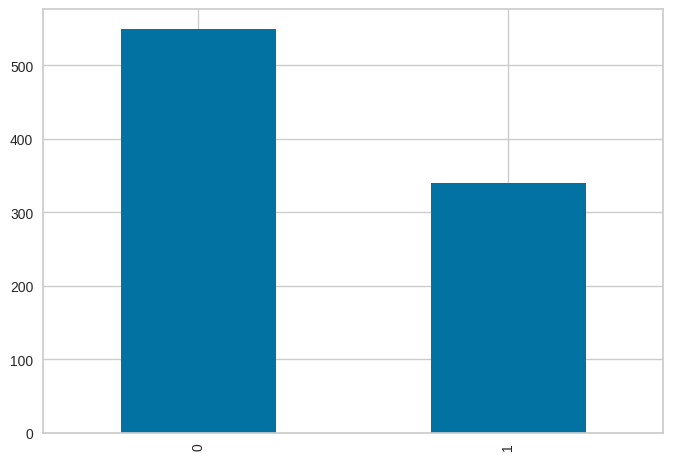

In [298]:
df_train.Survived.value_counts().plot(kind='bar')

# Os dados estão limpos, hora de aplicar os algoritmos

In [299]:
df_train

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.00000,1,0,A/5 21171,7.2500,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.00000,1,0,PC 17599,71.2833,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.00000,0,0,STON/O2. 3101282,7.9250,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.00000,1,0,113803,53.1000,S
4,5,0,3,"Allen, Mr. William Henry",male,35.00000,0,0,373450,8.0500,S
...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.00000,0,0,211536,13.0000,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.00000,0,0,112053,30.0000,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,25.14062,1,2,W./C. 6607,23.4500,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.00000,0,0,111369,30.0000,C


In [300]:
df_train.Ticket.value_counts()

347082      7
CA. 2343    7
1601        7
3101295     6
CA 2144     6
           ..
9234        1
19988       1
2693        1
PC 17612    1
370376      1
Name: Ticket, Length: 680, dtype: int64

In [301]:
# Nome , Ticket e Passenger ID nao importam

df_train.drop(['Name', 'PassengerId', 'Ticket'], inplace=True, axis=1)

In [302]:
le = LabelEncoder()

df_train.Sex = le.fit_transform(df_train.Sex)
df_train.Embarked = le.fit_transform(df_train.Embarked)

In [303]:
norm_scaler = MinMaxScaler()

df_normalized = pd.DataFrame(norm_scaler.fit_transform(df_train), columns=df_train.columns)
# df_normalized = pd.DataFrame(df_train)

In [304]:
df_normalized

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,0.0,1.0,1.0,0.271174,0.125,0.000000,0.014151,1.0
1,1.0,0.0,0.0,0.472229,0.125,0.000000,0.139136,0.0
2,1.0,1.0,0.0,0.321438,0.000,0.000000,0.015469,1.0
3,1.0,0.0,0.0,0.434531,0.125,0.000000,0.103644,1.0
4,0.0,1.0,1.0,0.434531,0.000,0.000000,0.015713,1.0
...,...,...,...,...,...,...,...,...
884,0.0,0.5,1.0,0.334004,0.000,0.000000,0.025374,1.0
885,1.0,0.0,0.0,0.233476,0.000,0.000000,0.058556,1.0
886,0.0,1.0,0.0,0.310639,0.125,0.333333,0.045771,1.0
887,1.0,0.0,1.0,0.321438,0.000,0.000000,0.058556,0.0


In [305]:
y = df_train['Survived']
x = df_normalized.drop('Survived', axis=1)

In [306]:
X_train, X2, Y_train, Y2 = train_test_split(x, y, test_size=0.3, random_state=43)

In [307]:
X_validation, X_test, Y_validation, Y_test = train_test_split(X2, Y2, test_size=0.66, random_state=43) # 2/3 de 30%

In [308]:
X_train.shape, Y_train.shape, X_test.shape, Y_test.shape, X_validation.shape, Y_validation.shape

((622, 7), (622,), (177, 7), (177,), (90, 7), (90,))

# KNN

In [309]:
knn = KNeighborsClassifier()

In [310]:
model = knn.fit(X_train, Y_train)

In [311]:
print(model.get_params())

{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}


In [312]:
model.set_params(n_neighbors=30, p=2)

KNeighborsClassifier(n_neighbors=30)

              precision    recall  f1-score   support

           0       0.88      0.97      0.92        60
           1       0.92      0.73      0.81        30

    accuracy                           0.89        90
   macro avg       0.90      0.85      0.87        90
weighted avg       0.89      0.89      0.89        90



/usr/local/lib/python3.10/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  warnings.warn(


0.8888888888888888

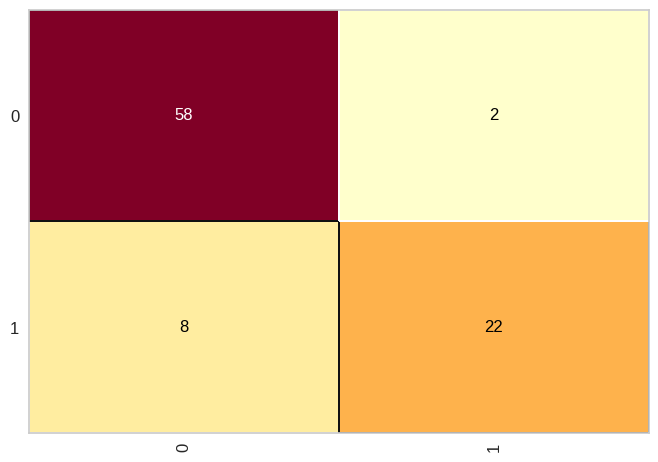

In [313]:
Y_pred = model.predict(X_validation)

print(classification_report(Y_validation, Y_pred))

cm = ConfusionMatrix(model)

cm.score(X_validation, Y_validation)

              precision    recall  f1-score   support

           0       0.77      0.96      0.85       104
           1       0.91      0.59      0.72        73

    accuracy                           0.81       177
   macro avg       0.84      0.78      0.79       177
weighted avg       0.83      0.81      0.80       177



/usr/local/lib/python3.10/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  warnings.warn(


0.807909604519774

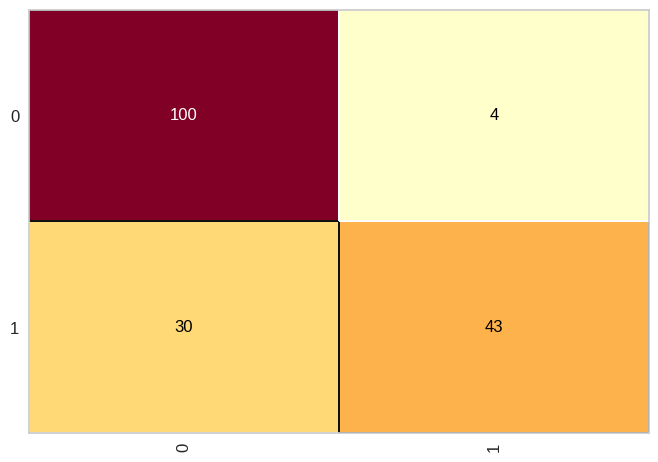

In [314]:
Y_pred = model.predict(X_test)

print(classification_report(Y_test, Y_pred))

cm = ConfusionMatrix(model)

cm.score(X_test, Y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


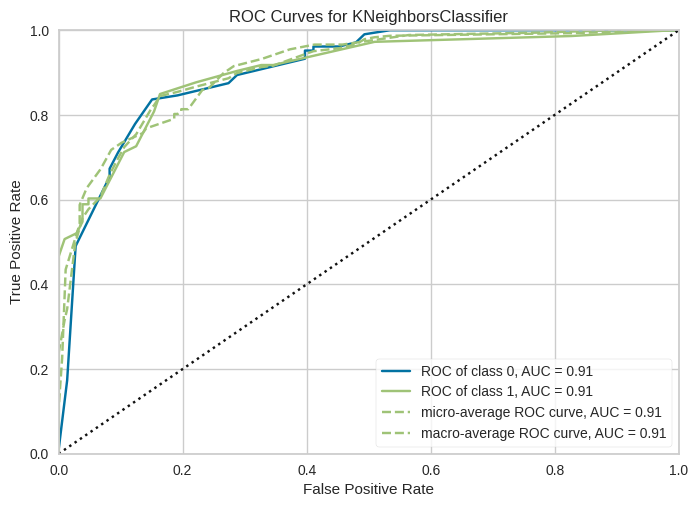

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for KNeighborsClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       estimator=KNeighborsClassifier(n_neighbors=30))

In [315]:
roc_auc(knn, X_test, Y_test)

#Conclusões:

Após tuning do modelo KNN, foi identificado que o melhor parametro de k vizinhos é 30 (não faz diferença na performance um valor maior). Com isso, obtivemos um score de 81%
Para chegar nestes resultados, foi realizado vários préprocessamentos, como o labelencoder e a normalização da coluna "Ano"

#Decision tree (Arvore de decisão)

In [316]:
dt = DecisionTreeClassifier()

In [317]:
model_dt = dt.fit(X_train, Y_train)

In [318]:
print(model_dt.get_params())

{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': None, 'splitter': 'best'}


In [319]:
model_dt.set_params(min_samples_split=2, max_depth=4, criterion='gini') #criterion='log_loss')

DecisionTreeClassifier(max_depth=4)

              precision    recall  f1-score   support

           0       0.82      0.85      0.84        60
           1       0.68      0.63      0.66        30

    accuracy                           0.78        90
   macro avg       0.75      0.74      0.75        90
weighted avg       0.77      0.78      0.78        90



/usr/local/lib/python3.10/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  warnings.warn(


0.8888888888888888

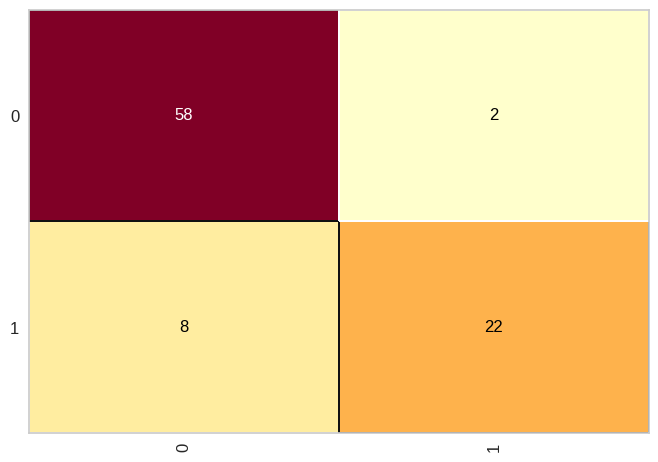

In [320]:
Y_pred = model_dt.predict(X_validation)

print(classification_report(Y_validation, Y_pred))

cm = ConfusionMatrix(model)

cm.score(X_validation, Y_validation)

In [321]:
Y_pred = model_dt.predict(X_test)

In [322]:
print(classification_report(Y_test, Y_pred))

              precision    recall  f1-score   support

           0       0.79      0.78      0.78       104
           1       0.69      0.70      0.69        73

    accuracy                           0.75       177
   macro avg       0.74      0.74      0.74       177
weighted avg       0.75      0.75      0.75       177



/usr/local/lib/python3.10/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  warnings.warn(


0.7457627118644068

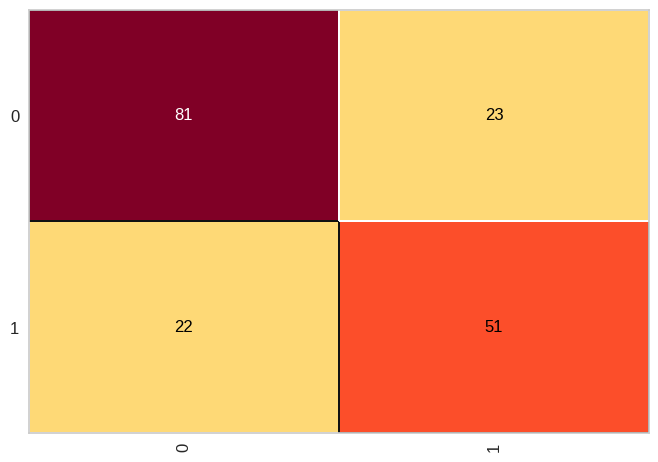

In [323]:
cm = ConfusionMatrix(model_dt)

cm.score(X_test, Y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


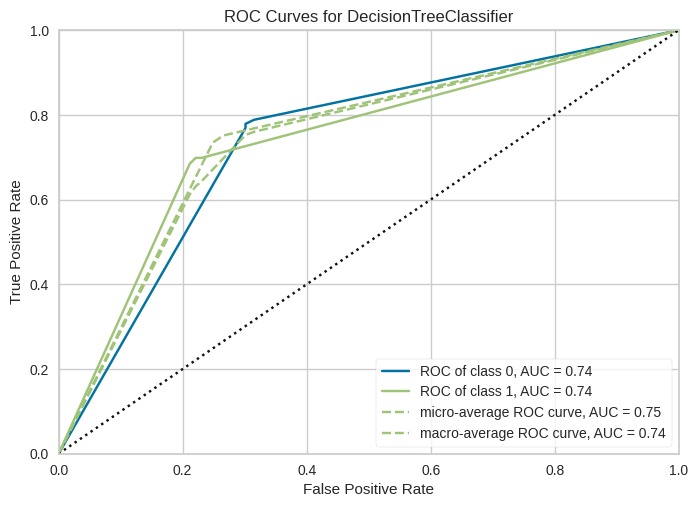

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       estimator=DecisionTreeClassifier(max_depth=4))

In [324]:
roc_auc(dt, X_test, Y_test)

In [325]:

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (20,20), dpi=800)
axes = plot_tree(dt, feature_names=X_train.columns, filled=True)

fig.show()

# Random Forest

In [326]:
rf = RandomForestClassifier()

In [327]:
model_rf = rf.fit(X_train, Y_train)

In [328]:
print(model_rf.get_params())

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


In [329]:
model_rf.set_params(n_estimators=100, random_state=42)

RandomForestClassifier(random_state=42)

In [330]:
print(model_rf.decision_path(X_test))

(<177x27180 sparse matrix of type '<class 'numpy.int64'>'
	with 180075 stored elements in Compressed Sparse Row format>, array([    0,   281,   550,   851,  1130,  1399,  1672,  1987,  2268,
        2557,  2818,  3061,  3312,  3587,  3836,  4109,  4374,  4631,
        4916,  5175,  5442,  5679,  5954,  6251,  6522,  6791,  7070,
        7353,  7612,  7887,  8160,  8441,  8720,  8985,  9284,  9583,
        9860, 10149, 10410, 10691, 10958, 11209, 11492, 11793, 12084,
       12353, 12594, 12861, 13162, 13453, 13722, 13993, 14272, 14509,
       14778, 15087, 15326, 15591, 15878, 16173, 16448, 16699, 16936,
       17191, 17462, 17745, 18008, 18221, 18508, 18789, 19072, 19389,
       19672, 19933, 20220, 20493, 20748, 21003, 21274, 21559, 21848,
       22105, 22360, 22651, 22926, 23175, 23418, 23689, 23962, 24225,
       24498, 24757, 25022, 25293, 25536, 25813, 26080, 26377, 26674,
       26955, 27180]))


              precision    recall  f1-score   support

           0       0.85      0.83      0.84        60
           1       0.68      0.70      0.69        30

    accuracy                           0.79        90
   macro avg       0.76      0.77      0.76        90
weighted avg       0.79      0.79      0.79        90



/usr/local/lib/python3.10/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  warnings.warn(


0.8888888888888888

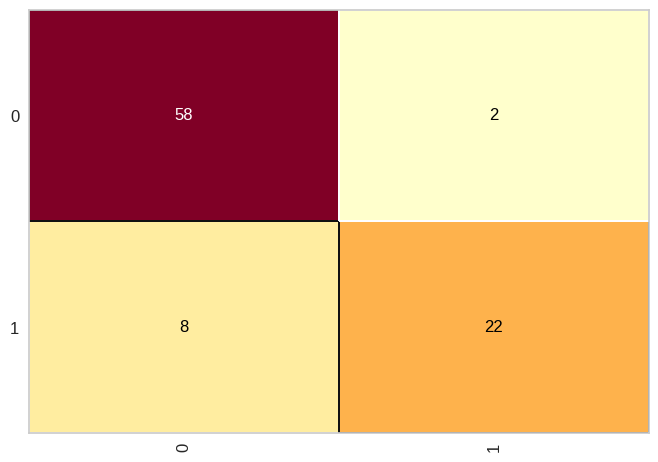

In [331]:
Y_pred = model_rf.predict(X_validation)

print(classification_report(Y_validation, Y_pred))

cm = ConfusionMatrix(model)

cm.score(X_validation, Y_validation)

In [332]:
Y_pred = model_rf.predict(X_test)

In [333]:
print(classification_report(Y_test, Y_pred))

              precision    recall  f1-score   support

           0       0.81      0.88      0.84       104
           1       0.81      0.70      0.75        73

    accuracy                           0.81       177
   macro avg       0.81      0.79      0.80       177
weighted avg       0.81      0.81      0.81       177



/usr/local/lib/python3.10/dist-packages/yellowbrick/classifier/base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  warnings.warn(


0.807909604519774

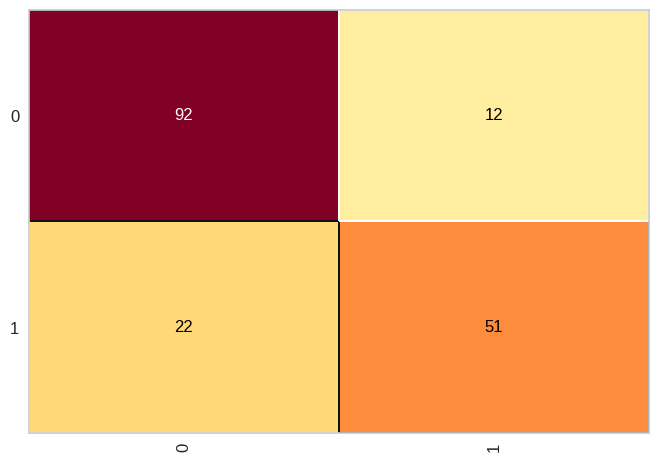

In [334]:
cm = ConfusionMatrix(model_rf)

cm.score(X_test, Y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


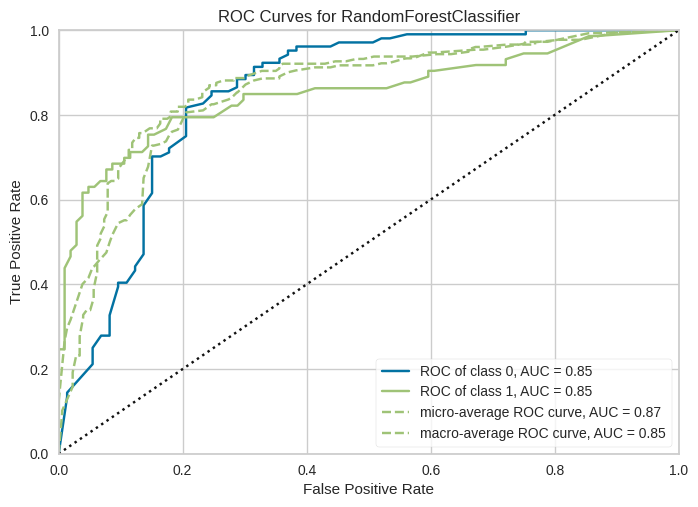

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       estimator=RandomForestClassifier(random_state=42))

In [335]:
roc_auc(rf, X_test, Y_test)

In [336]:

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (20,20), dpi=800)
axes = plot_tree(rf.estimators_[0], feature_names=X_train.columns, filled=True)

fig.show()

#Conclusões

Ambos os 3 algoritmos tiveram um resultado bom para predição de sobrevivencia no Titanic. O algoritmo de Random Forest foi o que mais obteve sucesso para predizer corretamente os valores. Porém, é o algoritmo que mais demanda recursos destes 3 selecionados. Outro ponto que notei, foi a diferença que a normalização e a tranformação dos dados fizeram na precisão e na otimização do modelo.